### Multiple Stocks ML & TA focused Price Target

In [1]:
from imports import *
import ta_functions as ta
import plotstock as ps

start_date = '2018-01-01'
ndays = 20

tickers = ['UNH', 'COIN', 'TSLA', 'XPEV', 'NIO', 'SMCI', 'CHPT', 'BABA', 'NVDA', 'DELL', 
           'SHOP', 'NKE', 'GOOGL', 'BA']

[*********************100%***********************]  1 of 1 completed


UNH .....
Root Mean Squared Error: 6.109
R^2 Score: 0.997
Current price of UNH: 300.68
UNH is predicted as a ----  SELL
Predicted (min, max): 302.0, 311.929


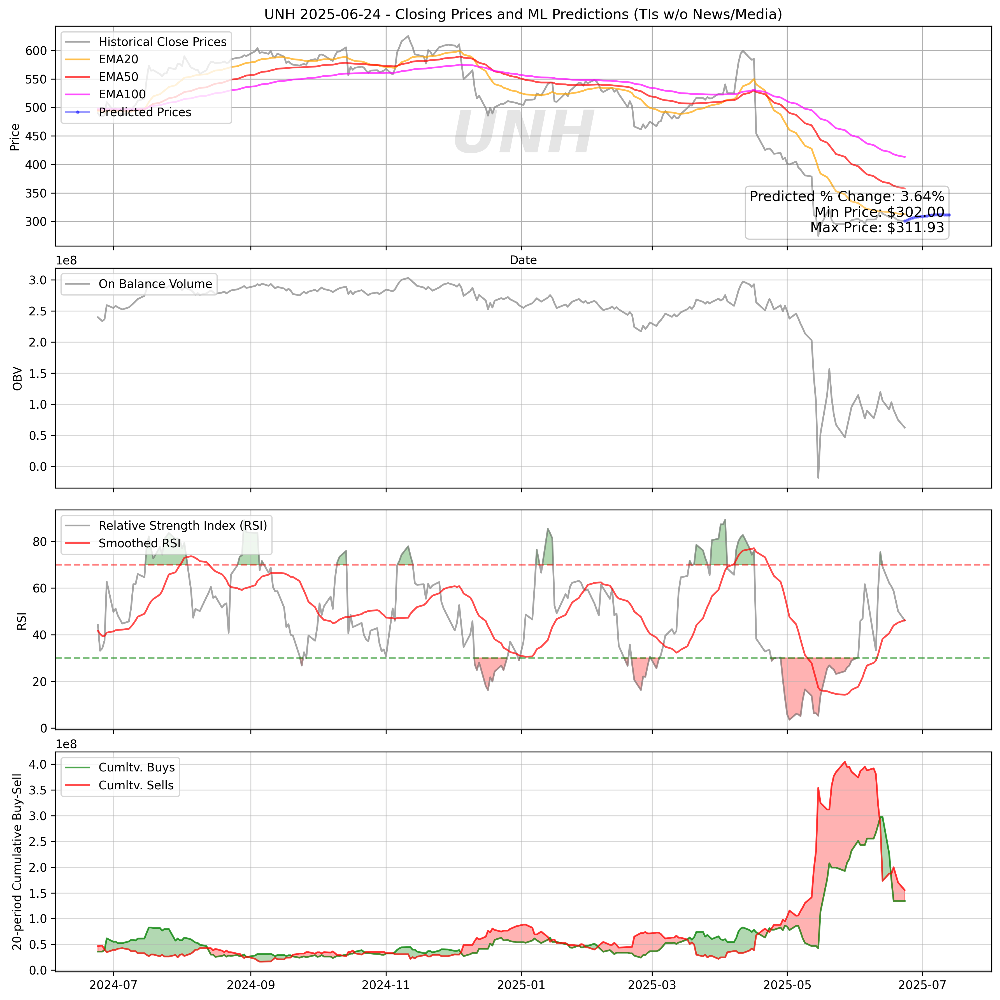

[*********************100%***********************]  1 of 1 completed


COIN .....
Root Mean Squared Error: 7.057
R^2 Score: 0.994
Current price of COIN: 307.59
COIN is predicted as a ----  BUY
Predicted (min, max): 275.102, 304.949


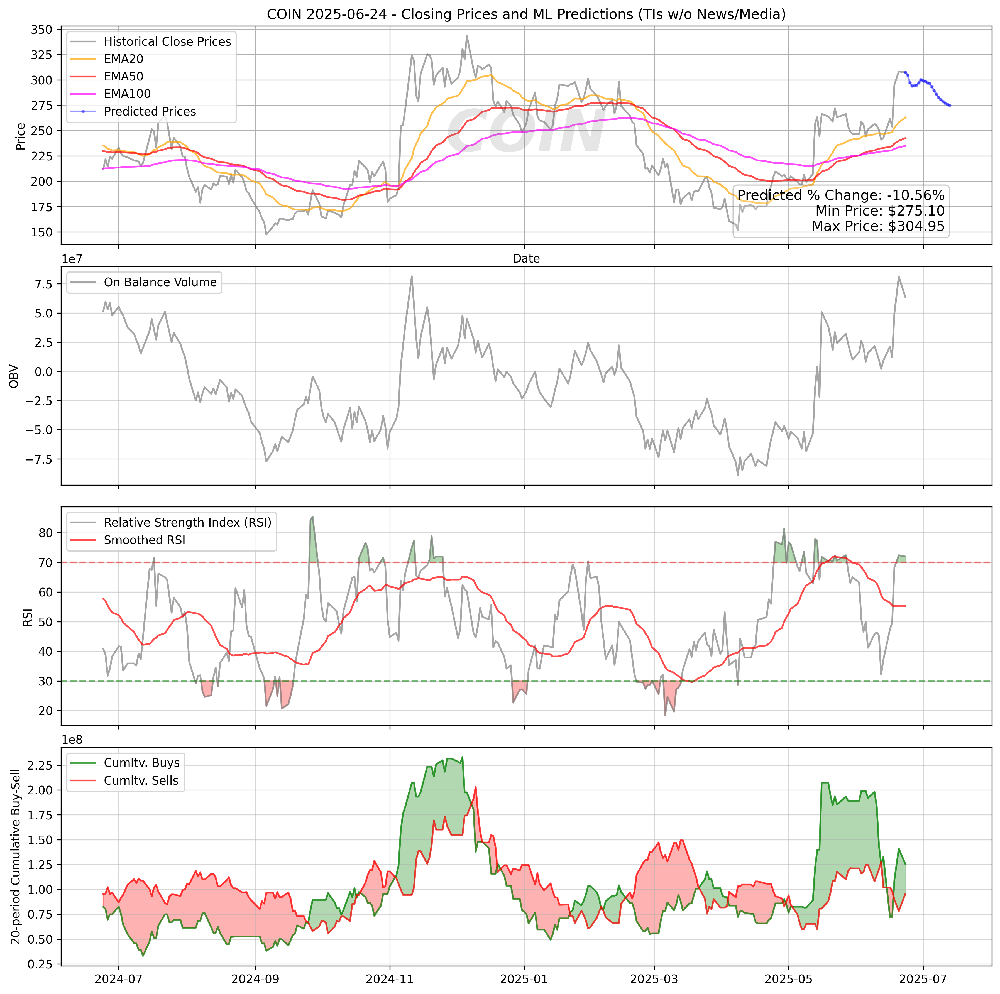

[*********************100%***********************]  1 of 1 completed


TSLA .....
Root Mean Squared Error: 7.376
R^2 Score: 0.996
Current price of TSLA: 348.68
TSLA is predicted as a ----  BUY
Predicted (min, max): 323.178, 344.053


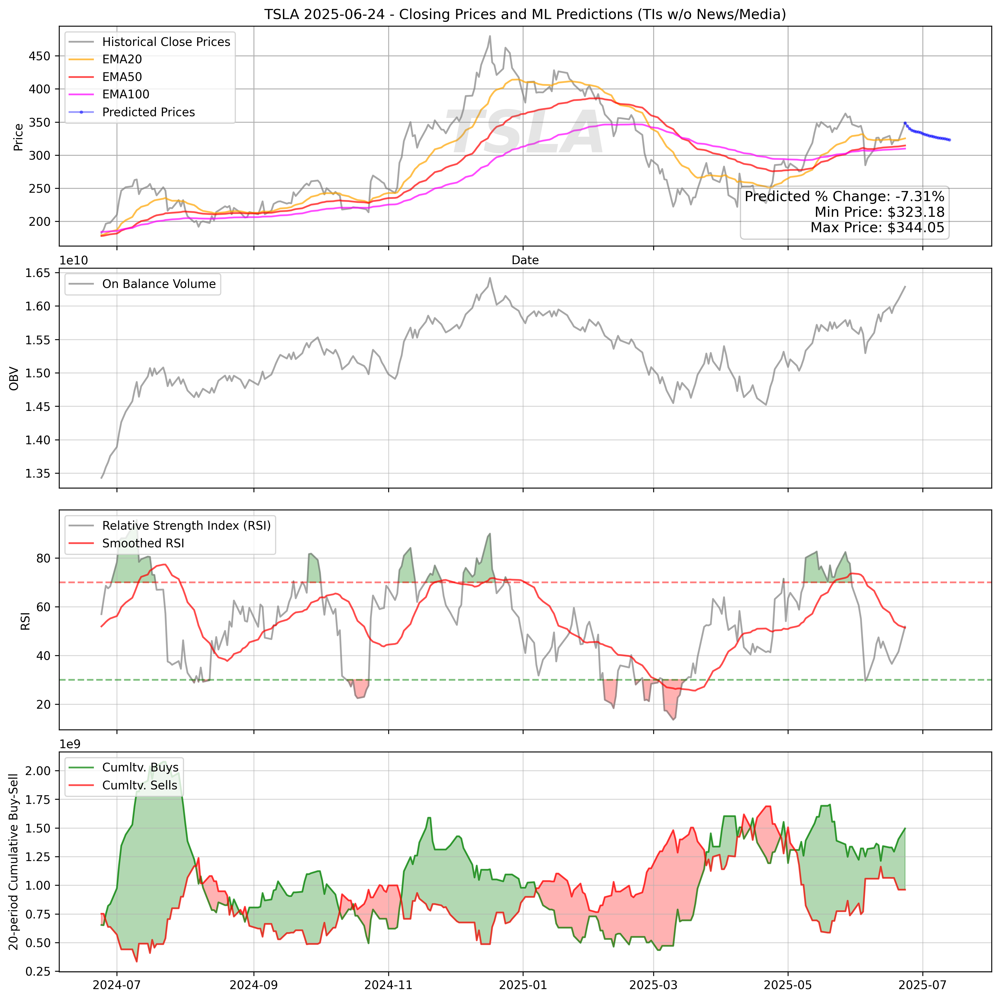

[*********************100%***********************]  1 of 1 completed


XPEV .....
Root Mean Squared Error: 0.987
R^2 Score: 0.994
Current price of XPEV: 19.17
XPEV is predicted as a ----  SELL
Predicted (min, max): 17.322, 19.162


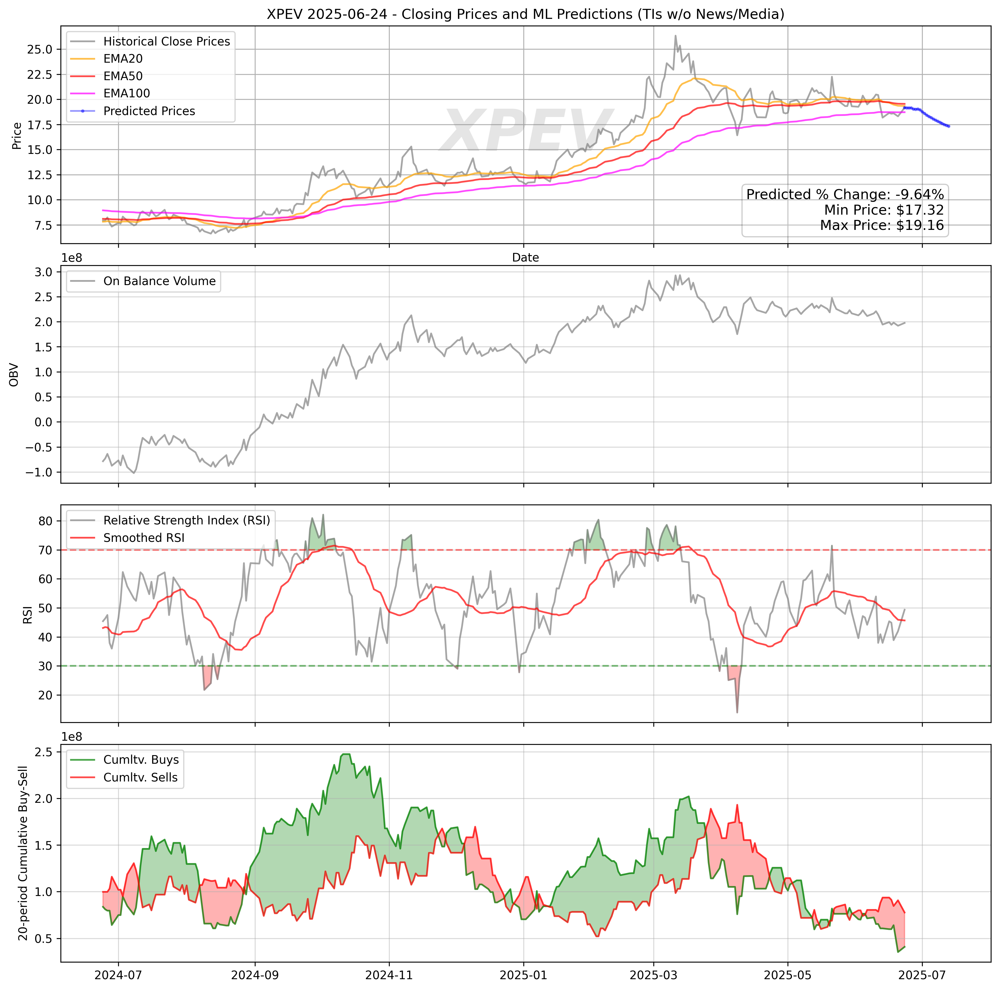

[*********************100%***********************]  1 of 1 completed


NIO .....
Root Mean Squared Error: 0.904
R^2 Score: 0.997
Current price of NIO: 3.43
NIO is predicted as a ----  SELL
Predicted (min, max): 3.36, 3.427


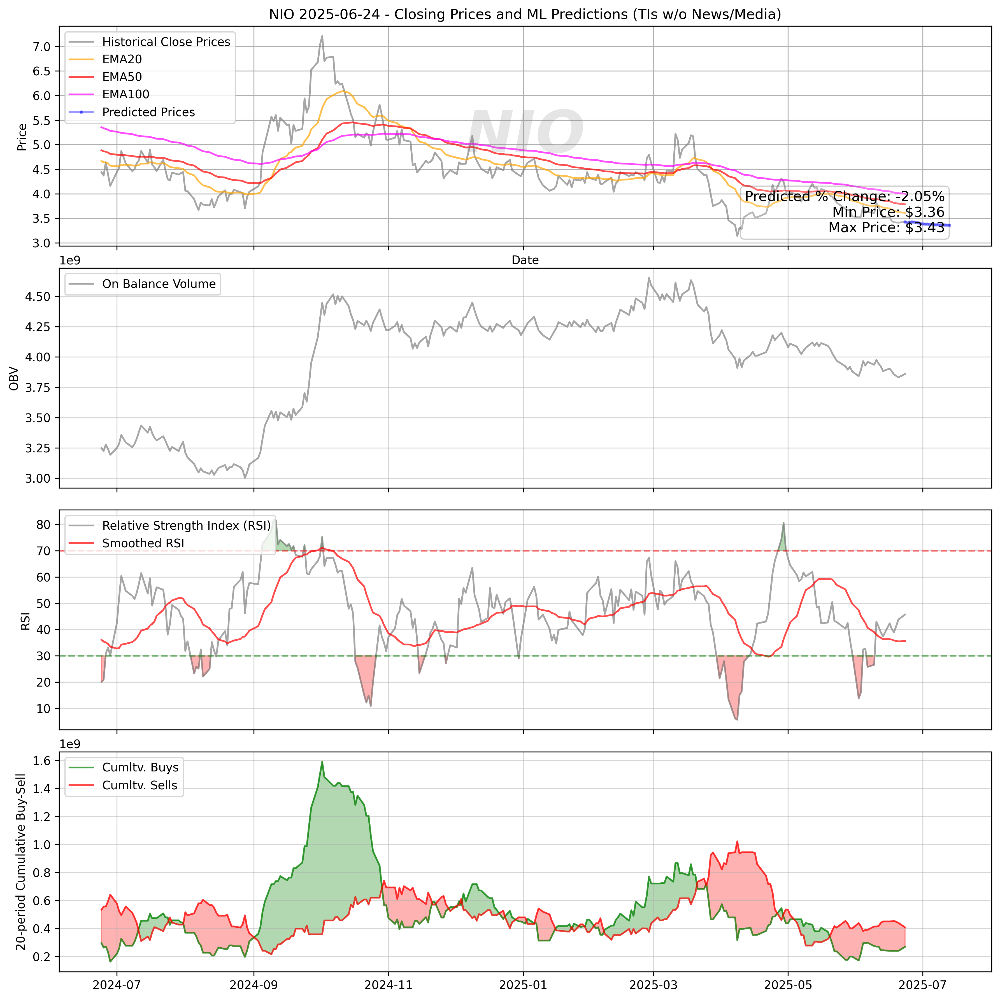

[*********************100%***********************]  1 of 1 completed


SMCI .....
Root Mean Squared Error: 1.183
R^2 Score: 0.997
Current price of SMCI: 40.89
SMCI is predicted as a ----  BUY
Predicted (min, max): 40.943, 46.994


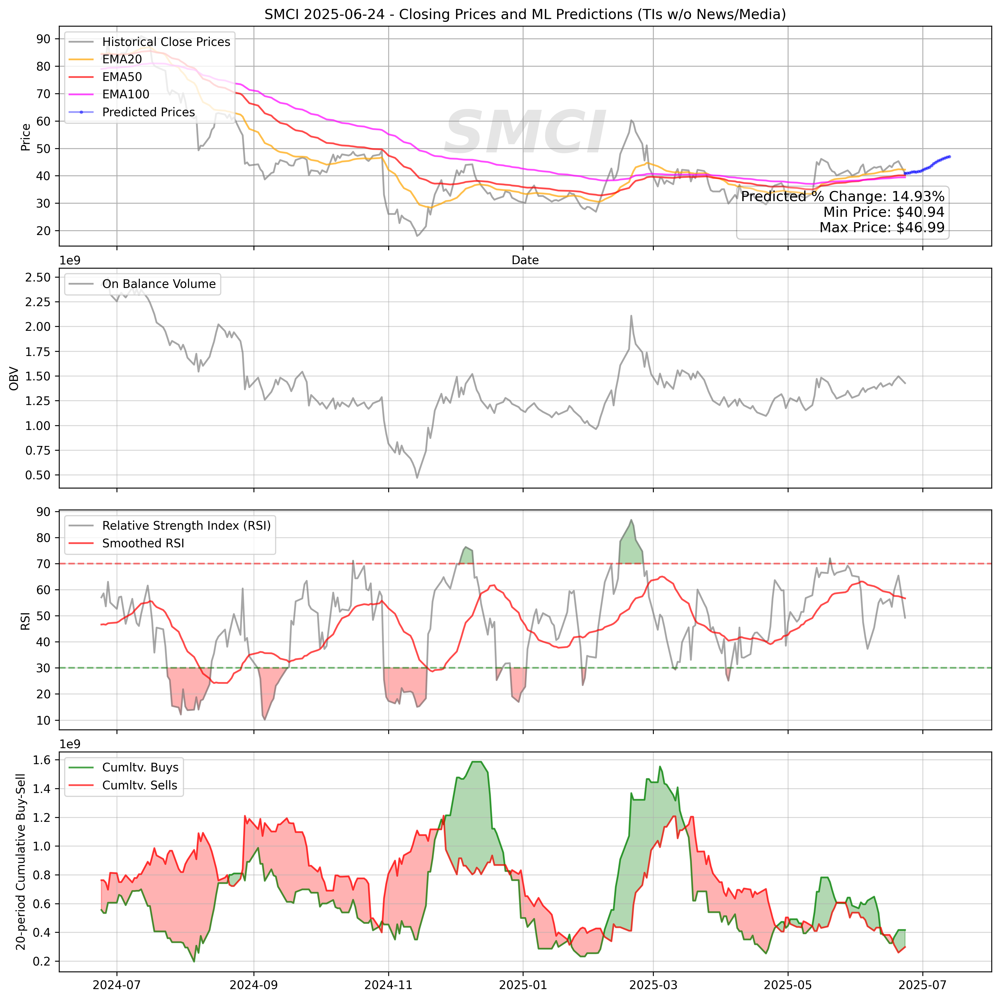

[*********************100%***********************]  1 of 1 completed


CHPT .....
Root Mean Squared Error: 0.557
R^2 Score: 0.997
Current price of CHPT: 0.68
CHPT is predicted as a ----  SELL
Predicted (min, max): 0.69, 0.714


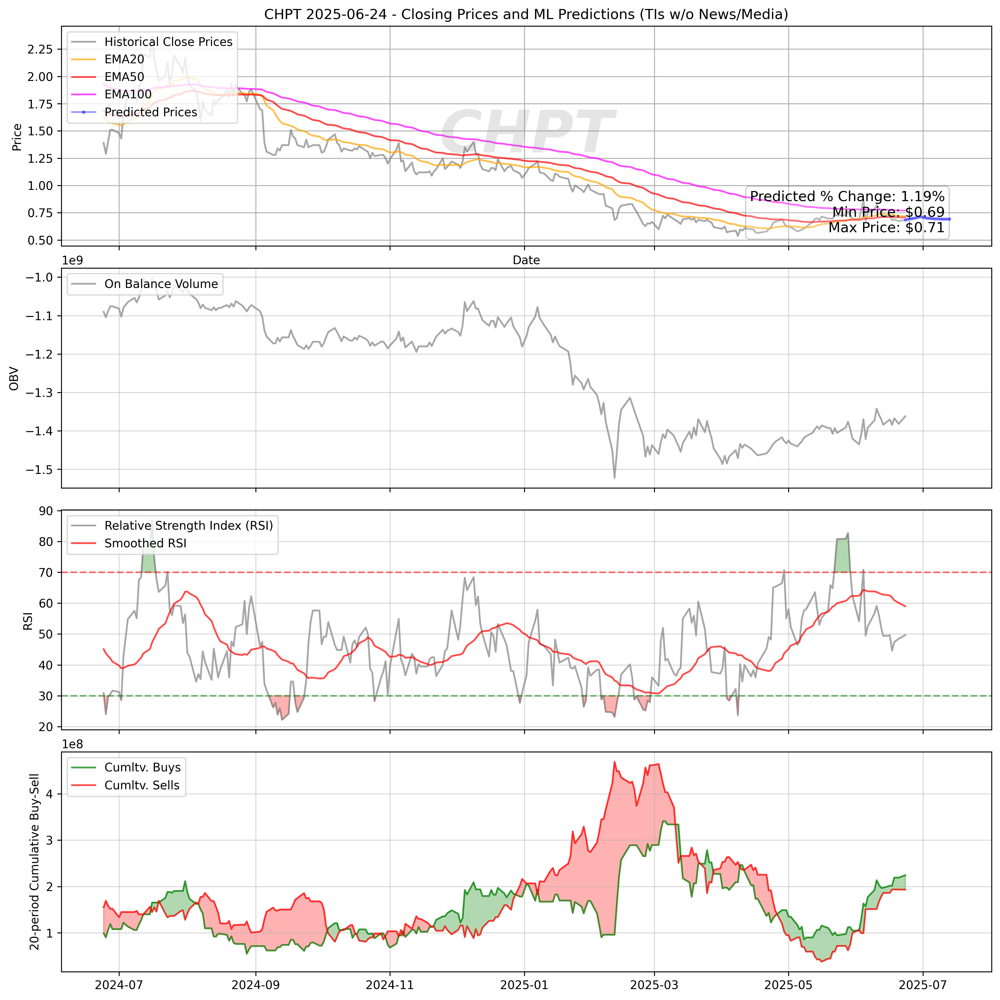

[*********************100%***********************]  1 of 1 completed


BABA .....
Root Mean Squared Error: 3.982
R^2 Score: 0.996
Current price of BABA: 113.09
BABA is predicted as a ----  SELL
Predicted (min, max): 112.68, 118.653


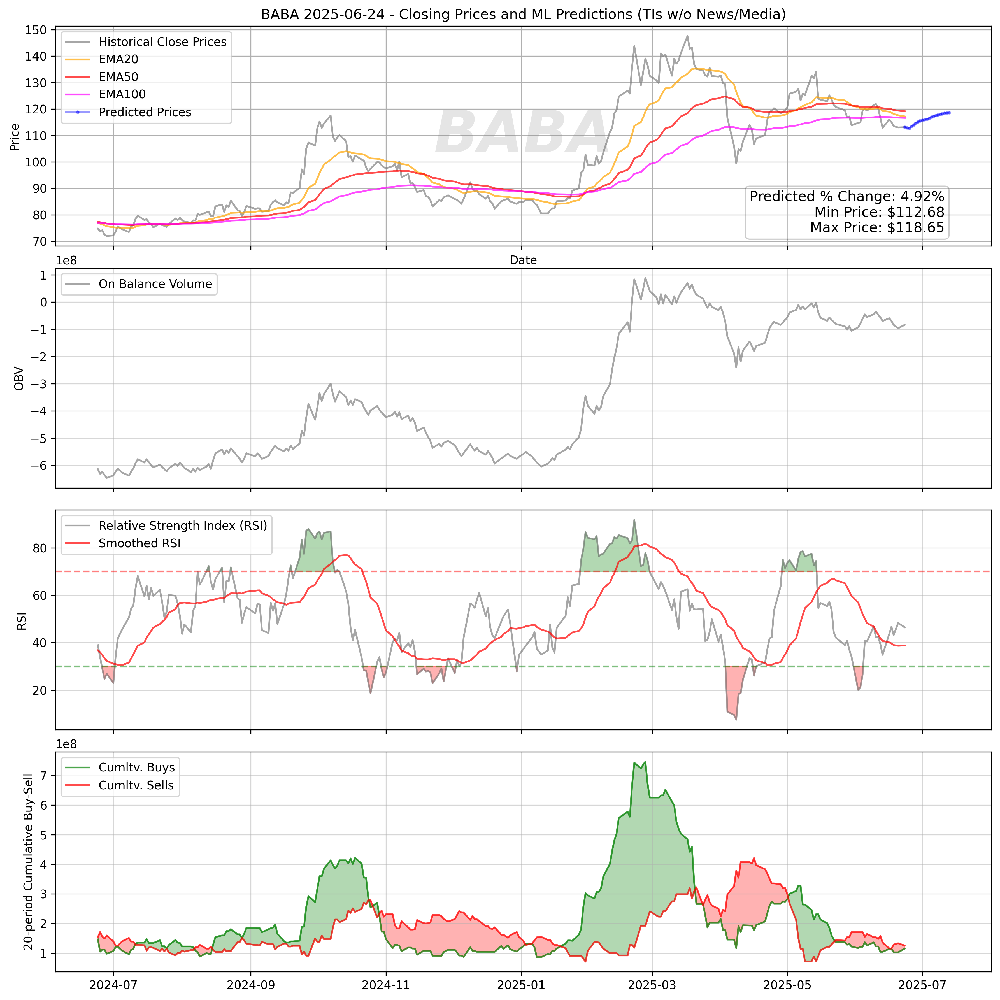

[*********************100%***********************]  1 of 1 completed


NVDA .....
Root Mean Squared Error: 1.512
R^2 Score: 0.999
Current price of NVDA: 144.17
NVDA is predicted as a ----  BUY
Predicted (min, max): 139.655, 144.17


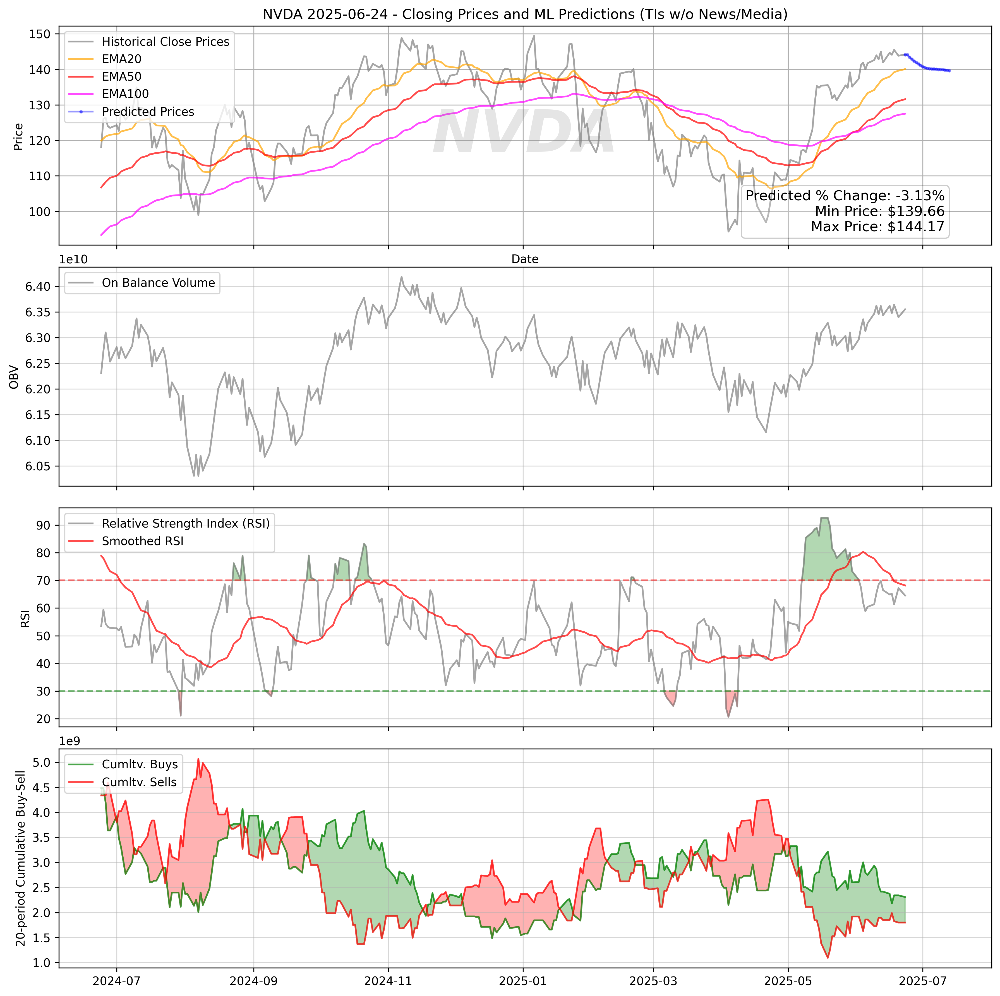

[*********************100%***********************]  1 of 1 completed


DELL .....
Root Mean Squared Error: 1.472
R^2 Score: 0.998
Current price of DELL: 118.02
DELL is predicted as a ----  BUY
Predicted (min, max): 118.099, 126.162


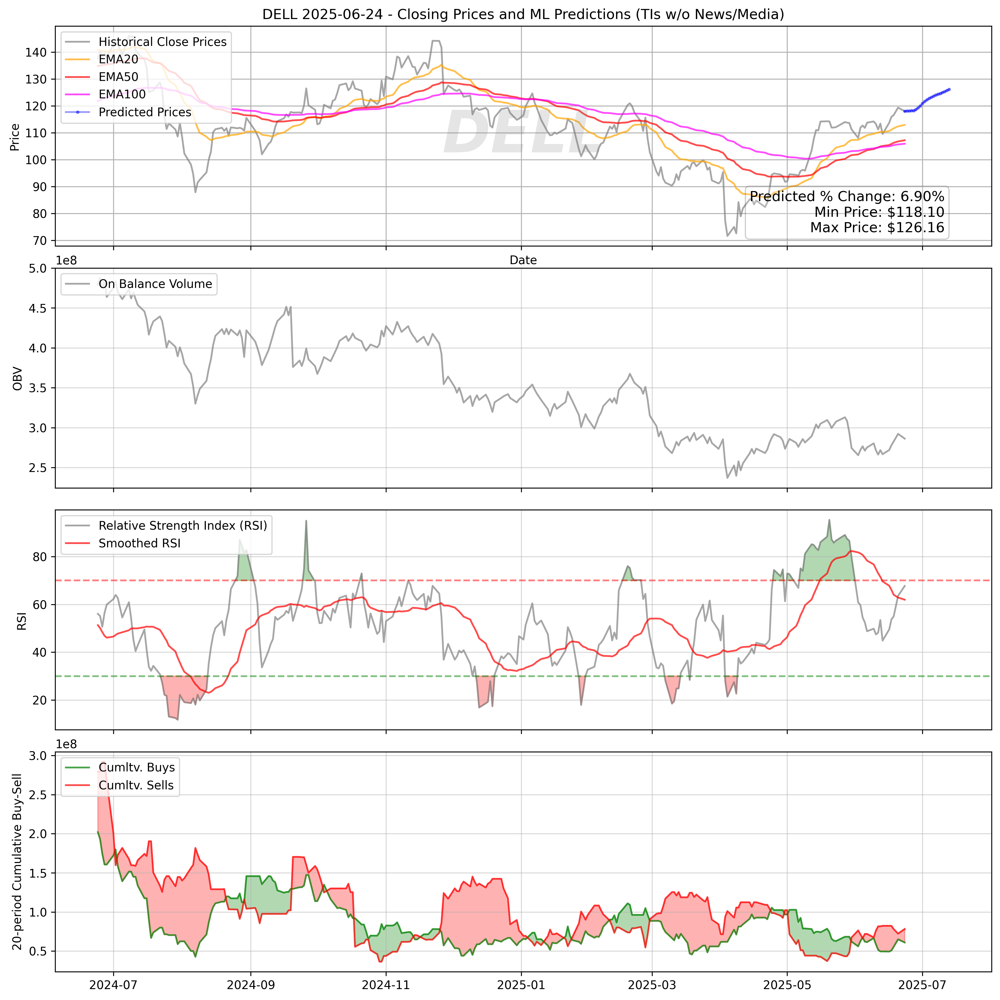

[*********************100%***********************]  1 of 1 completed


SHOP .....
Root Mean Squared Error: 2.485
R^2 Score: 0.997
Current price of SHOP: 109.98
SHOP is predicted as a ----  BUY
Predicted (min, max): 109.166, 111.809


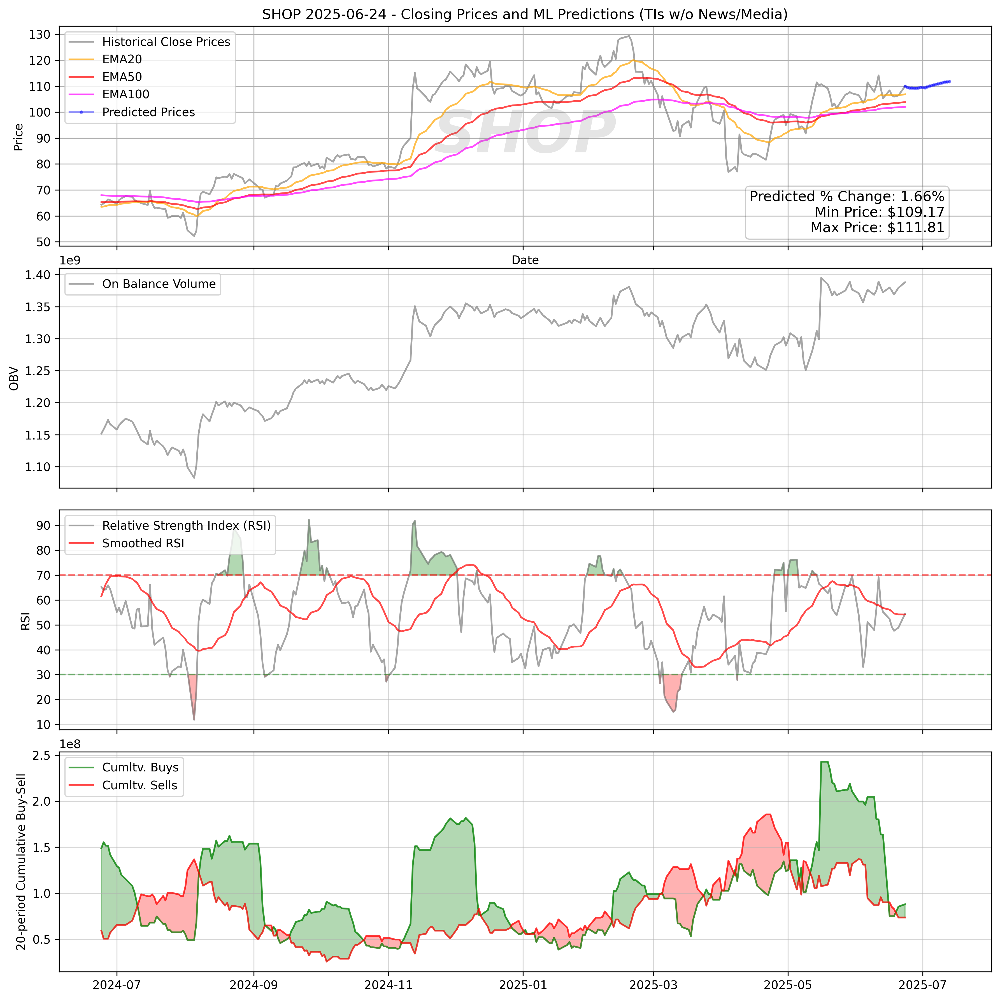

[*********************100%***********************]  1 of 1 completed


NKE .....
Root Mean Squared Error: 1.892
R^2 Score: 0.996
Current price of NKE: 60.78
NKE is predicted as a ----  SELL
Predicted (min, max): 60.95, 63.525


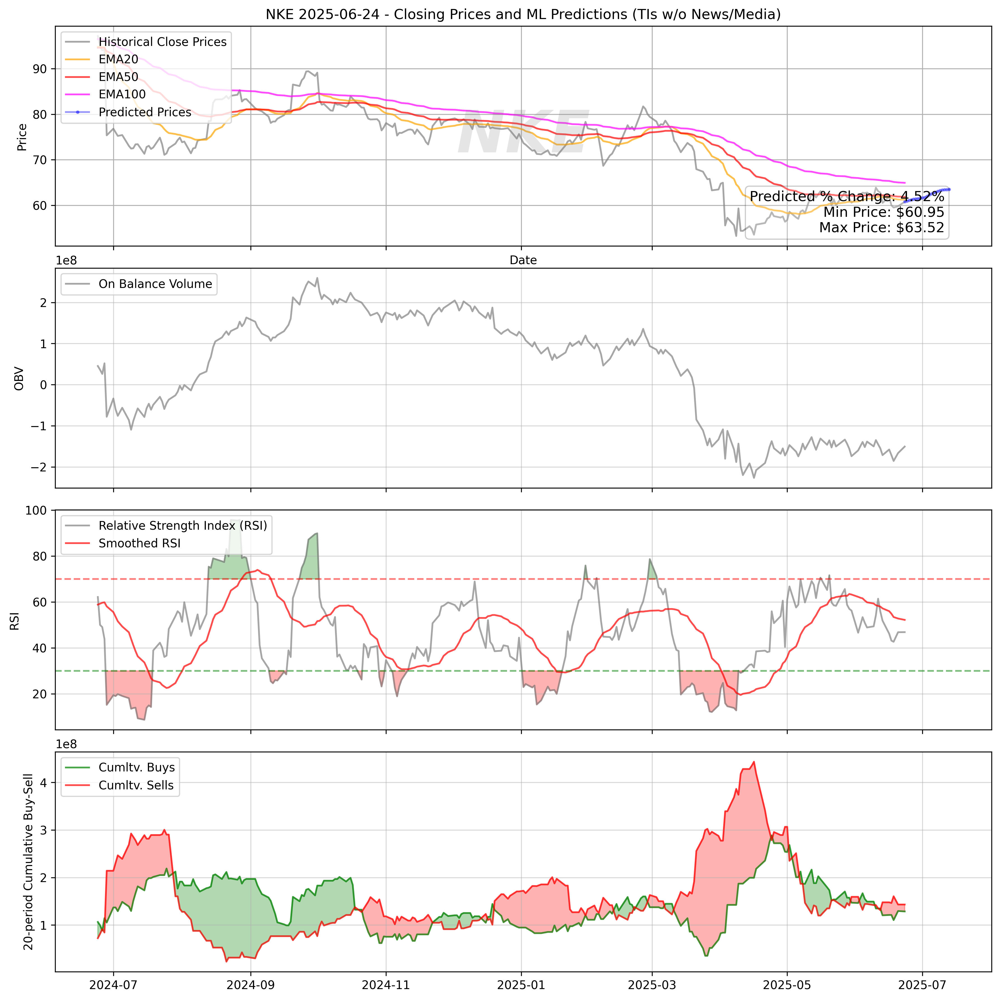

[*********************100%***********************]  1 of 1 completed


GOOGL .....
Root Mean Squared Error: 2.002
R^2 Score: 0.998
Current price of GOOGL: 165.19
GOOGL is predicted as a ----  SELL
Predicted (min, max): 165.665, 173.228


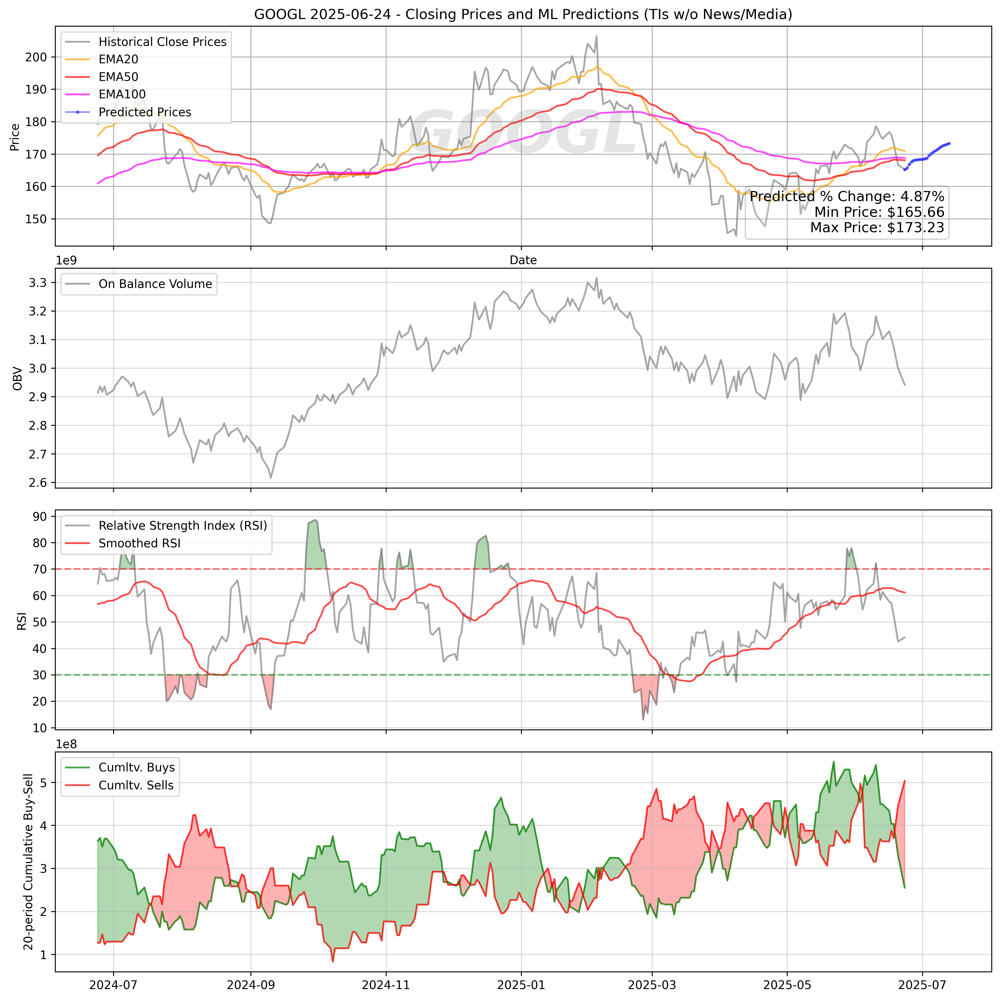

[*********************100%***********************]  1 of 1 completed


BA .....
Root Mean Squared Error: 6.509
R^2 Score: 0.993
Current price of BA: 201.31
BA is predicted as a ----  BUY
Predicted (min, max): 201.73, 207.198


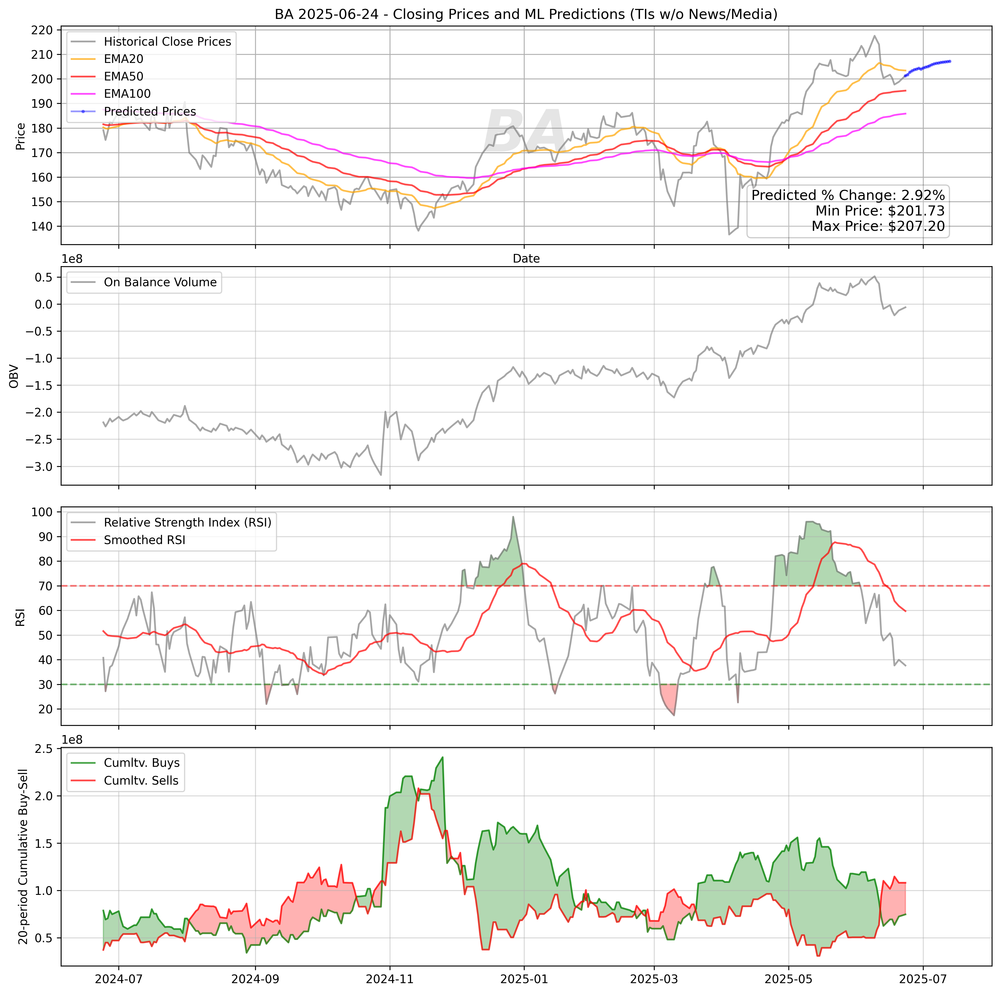

In [2]:
for stock in tickers:
    current_date = datetime.now().strftime('%Y-%m-%d')
    stock_df = ta.get_stock_data(stock, start_date, current_date)
    stock_df = ta.add_technical_indicators(stock_df) 
    stock_df = ta.add_candlestickpatterns(stock_df)
    X, y, scaler = ta.prepare_ml_data(stock_df)

    print(f'{stock}', ".....")
    X_train, X_test, y_train, y_test = ta.train_test_split(X, y, test_size=0.1, random_state=2000)
    model = ta.train_model(X_train, y_train, nest=1000, md=6)
    
    ta.evaluate_model(model, X_test, y_test)
    current_price = round(stock_df['Close'].iloc[-1], 2)  # Most recent closing price
    print(f'Current price of {stock}:' , current_price)

    # Make predictions
    predicted_prices = ta.predict_prices(model, stock_df, scaler, num_days=ndays, window_size=500)
    
    signal = ta.generate_signal(predicted_prices, current_price, stock_df)
    print(stock + " is predicted as a ---- ", signal)

    # PLOT PREDICTION
    ps.plot_with_predictions(stock_df, predicted_prices, ticker = stock, num_days=ndays)